# **YOLOv11 Object Detection & Composite Image Visualization**
## **Generating & Evaluating Model Predictions**
---
### 📌 **Overview**
This notebook leverages a trained **YOLOv11** model to detect objects in a test dataset and visualize predictions. It goes beyond simple inference by creating **composite images** with multiple test samples, enabling clearer comparisons between **ground truth labels and model predictions**. 

### 🔍 **Key Features**
- **Loads a trained YOLOv11 model** and applies it to test images  
- **Generates composite images** by arranging multiple test samples into grids  
- **Overlays ground truth labels** for easy comparison with predictions  
- **Runs model inference** and visualizes bounding boxes & confidence scores  
- **Experiments with different layouts**, scaling, and background textures  

### 🛠 **Setup & Requirements**
- Ensure the **test images** and **labels** are in the correct directories  
- Update the **model path** if necessary  
- Install missing dependencies using:  
  ```bash
  pip install ultralytics opencv-python matplotlib numpy


In [1]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from ultralytics import YOLO

In [2]:
# Load the trained model
model = YOLO("/Users/afnanag/projects/DH307/yolov11/runs/detect/train10/weights/best.pt")

# Path to test images
test_img_dir = "/Users/afnanag/projects/DH307/yolov11/augmentation/composite_data/augmented_data2/test/images"

## **🔲 Composite Image Grids with Ground Truth Labels**
This section arranges multiple test images into **structured grid layouts** and overlays their ground truth labels.  
- **Creates grids** (e.g., **3×3, 2×4**) for easy side-by-side visualization  
- **Supports magnification & resizing** for better clarity  
- **Runs YOLO predictions** and overlays **bounding boxes & confidence scores**  



0: 384x384 1 basophil, 1 erythoblast, 1 immature granulocyte, 2 lymphocytes, 1 monocyte, 2 neutrophils, 1 lymphoblast, 89.1ms
Speed: 1.6ms preprocess, 89.1ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 384)


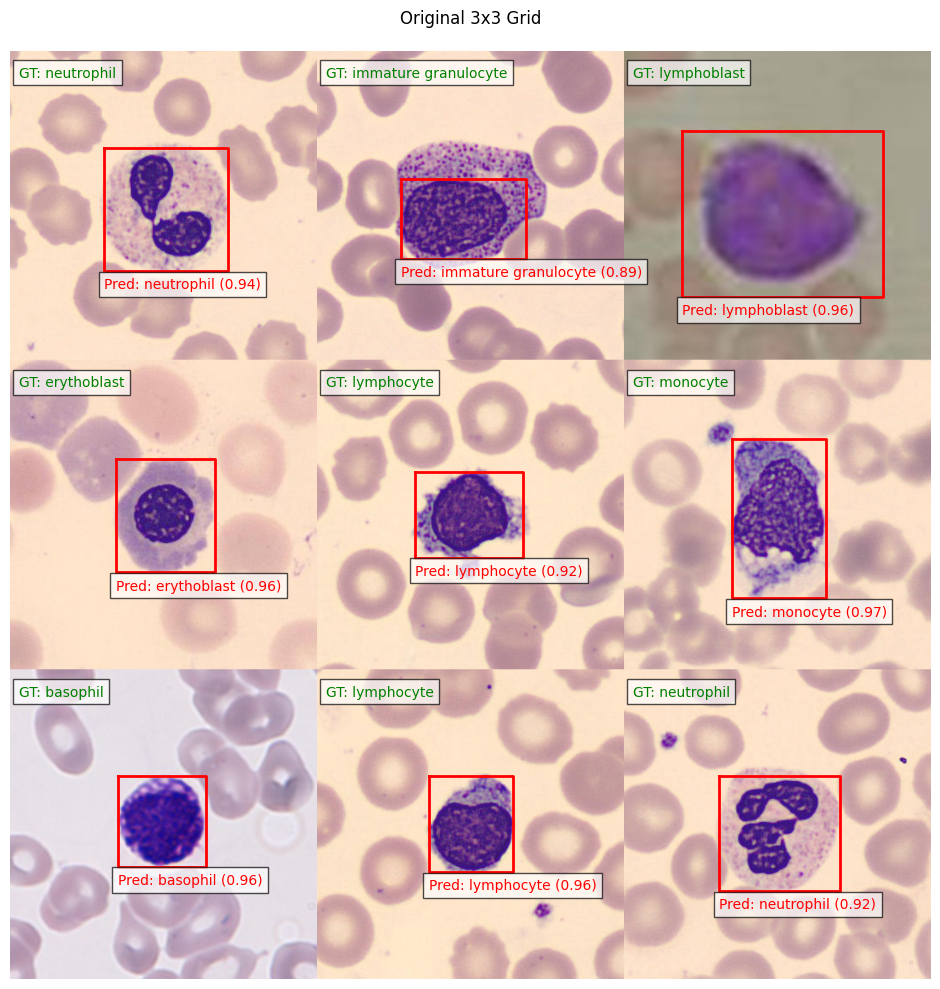


0: 384x384 1 basophil, 1 erythoblast, 1 immature granulocyte, 2 lymphocytes, 1 monocyte, 2 neutrophils, 1 lymphoblast, 105.4ms
Speed: 1.3ms preprocess, 105.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 384)


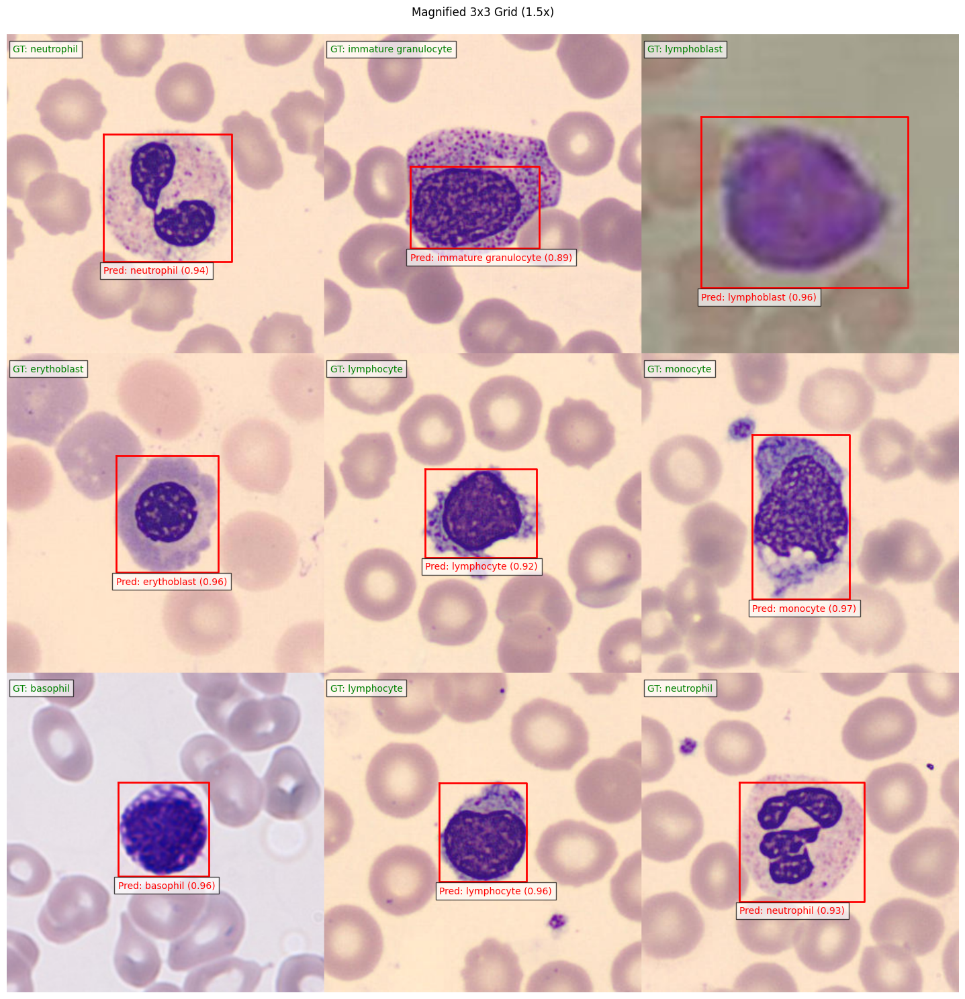


0: 224x384 1 basophil, 1 erythoblast, 1 immature granulocyte, 2 lymphocytes, 1 monocyte, 1 neutrophil, 1 lymphoblast, 114.0ms
Speed: 0.8ms preprocess, 114.0ms inference, 0.4ms postprocess per image at shape (1, 3, 224, 384)


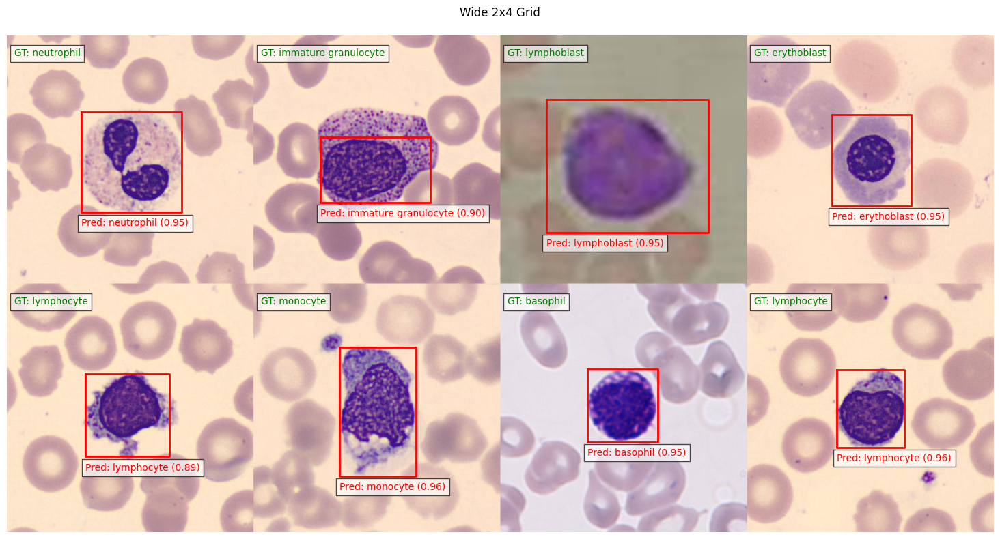


0: 288x384 1 basophil, 1 erythoblast, 1 immature granulocyte, 2 lymphocytes, 1 monocyte, 2 neutrophils, 1 lymphoblast, 73.4ms
Speed: 1.1ms preprocess, 73.4ms inference, 0.3ms postprocess per image at shape (1, 3, 288, 384)


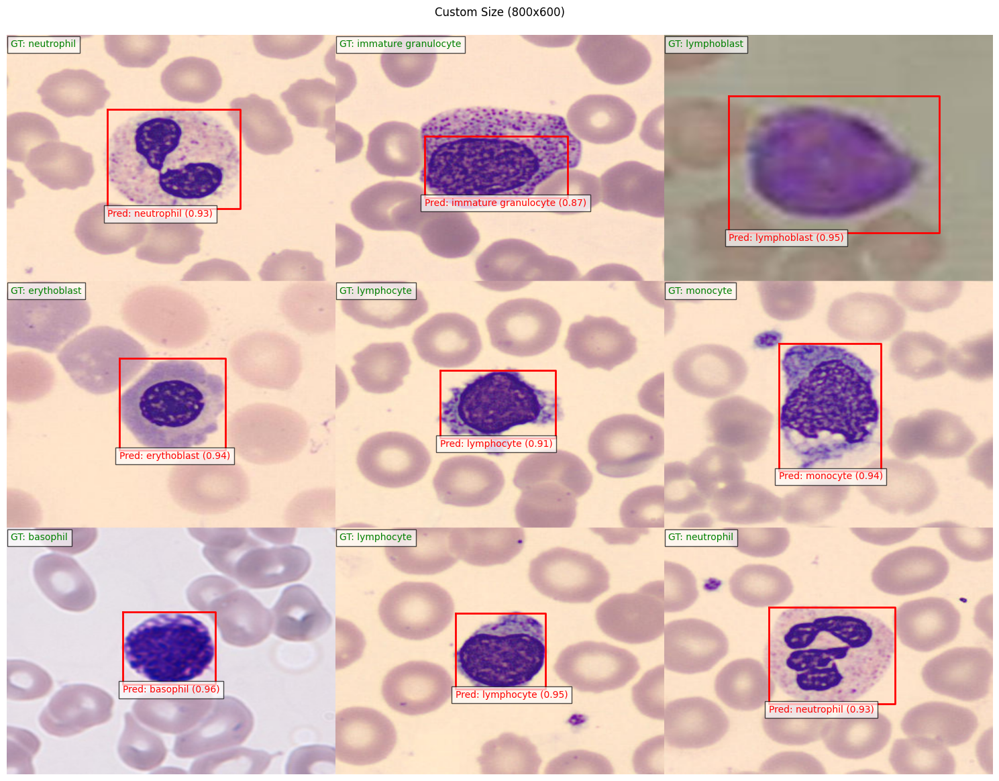

In [3]:
def select_random_images(img_dir, num_images):
    """
    Select random images from directory
    """
    test_images = list(Path(img_dir).glob("*.jpg")) + list(Path(img_dir).glob("*.png"))
    return random.sample(test_images, num_images)

def read_label_file(label_path):
    """
    Read YOLO format label file and return class indices
    """
    classes = []
    if label_path.exists():
        with open(label_path, 'r') as f:
            for line in f:
                class_idx = int(line.split()[0])
                classes.append(class_idx)
    return classes

def create_combined_image_with_labels(selected_images, label_dir, class_names, grid_size=(3, 3), 
                                    magnification=1.0, target_size=None):
    """
    Create combined image using pre-selected images
    """
    # Read first image to get base dimensions
    first_img = cv2.imread(str(selected_images[0]))
    orig_height, orig_width = first_img.shape[:2]
    
    # Calculate dimensions based on magnification or target size
    if target_size:
        img_width, img_height = target_size
    else:
        img_width = int(orig_width * magnification)
        img_height = int(orig_height * magnification)
    
    # Create combined image canvas
    combined_img = np.zeros((img_height * grid_size[0], img_width * grid_size[1], 3), 
                          dtype=np.uint8)
    all_labels = []
    
    for idx, img_path in enumerate(selected_images):
        label_path = Path(label_dir) / (img_path.stem + '.txt')
        img = cv2.imread(str(img_path))
        img = cv2.resize(img, (img_width, img_height))
        class_indices = read_label_file(label_path)
        labels = [class_names[idx] for idx in class_indices]
        all_labels.append(labels)
        
        row = idx // grid_size[1]
        col = idx % grid_size[1]
        y_start = row * img_height
        y_end = (row + 1) * img_height
        x_start = col * img_width
        x_end = (col + 1) * img_width
        combined_img[y_start:y_end, x_start:x_end] = img
        
    return combined_img, all_labels

def visualize_predictions_and_truth(combined_img, all_labels, results, grid_size=(3, 3), 
                                  figure_size=(10, 10), title=None):
    """
    Visualize predictions with optional title
    """
    plt.figure(figsize=figure_size)
    plt.imshow(cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB))
    
    if title:
        plt.title(title, pad=20)
    
    img_height = combined_img.shape[0] // grid_size[0]
    img_width = combined_img.shape[1] // grid_size[1]
    
    # Add ground truth labels
    for idx, labels in enumerate(all_labels):
        row = idx // grid_size[1]
        col = idx % grid_size[1]
        x = col * img_width + 10
        y = row * img_height + 30
        gt_text = "GT: " + ', '.join(set(labels))
        plt.text(x, y, gt_text,
                bbox=dict(facecolor='white', alpha=0.7),
                fontsize=10,
                color='green')
    
    # Add predictions and boxes
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf.cpu().numpy()[0]
            cls = box.cls.cpu().numpy()[0]
            plt.plot([x1, x2, x2, x1, x1], [y1, y1, y2, y2, y1], 'r-', linewidth=2)
            pred_text = f'Pred: {model.names[int(cls)]} ({conf:.2f})'
            plt.text(x1, y2 + 20, pred_text,
                    bbox=dict(facecolor='white', alpha=0.7),
                    fontsize=10,
                    color='red')
    
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Example usage with same images:
def run_multiple_visualizations(test_img_dir, label_dir, model, num_images=9):
    # First, select the images we'll use for all visualizations
    selected_images = select_random_images(test_img_dir, num_images)
    
    # 1. Basic 3x3 grid
    combined_img, all_labels = create_combined_image_with_labels(
        selected_images, 
        label_dir,
        model.names,
        grid_size=(3, 3)
    )
    results = model(combined_img)
    visualize_predictions_and_truth(combined_img, all_labels, results, 
                                  grid_size=(3, 3),
                                  title="Original 3x3 Grid")

    # 2. Same images with magnification
    combined_img_mag, all_labels = create_combined_image_with_labels(
        selected_images, 
        label_dir,
        model.names,
        grid_size=(3, 3),
        magnification=1.5
    )
    results_mag = model(combined_img_mag)
    visualize_predictions_and_truth(combined_img_mag, all_labels, results_mag, 
                                  grid_size=(3, 3),
                                  figure_size=(15, 15),
                                  title="Magnified 3x3 Grid (1.5x)")

    # 3. Same images in 2x4 grid (using first 8 images)
    combined_img_wide, all_labels_wide = create_combined_image_with_labels(
        selected_images[:8], 
        label_dir,
        model.names,
        grid_size=(2, 4)
    )
    results_wide = model(combined_img_wide)
    cv2.imwrite('output_wide.png', combined_img_wide)
    visualize_predictions_and_truth(combined_img_wide, all_labels_wide, results_wide, 
                                  grid_size=(2, 4),
                                  figure_size=(16, 8),
                                  title="Wide 2x4 Grid")

    # 4. Same images with custom size
    combined_img_custom, all_labels = create_combined_image_with_labels(
        selected_images, 
        label_dir,
        model.names,
        grid_size=(3, 3),
        target_size=(800, 600)
    )
    results_custom = model(combined_img_custom)
    visualize_predictions_and_truth(combined_img_custom, all_labels, results_custom, 
                                  grid_size=(3, 3),
                                  figure_size=(15, 15),
                                  title="Custom Size (800x600)")

# Run all visualizations
label_dir = test_img_dir.replace('images', 'labels')
run_multiple_visualizations(test_img_dir, label_dir, model)

# To save any particular visualization:
# cv2.imwrite('output_magnified.png', combined_img_mag)
# cv2.imwrite('output_wide.png', combined_img_wide)
# cv2.imwrite('output_custom.png', combined_img_custom)

## **🎨 Composite Images with Random Placement & Background Textures**
Instead of fixed grids, this section **randomly places objects** onto a background for a more **realistic scene simulation.**  
- **Uses a provided background image** instead of a blank canvas  
- **Randomly positions, scales, and rotates images** to avoid uniform layouts  
- **Ensures no overlap conflicts** while maximizing object density  
- **Runs YOLO predictions** and overlays **bounding boxes & confidence scores**  



0: 384x384 3 basophils, 2 eosinophils, 1 erythoblast, 3 immature granulocytes, 2 neutrophils, 5 plateletss, 80.8ms
Speed: 1.0ms preprocess, 80.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 384)


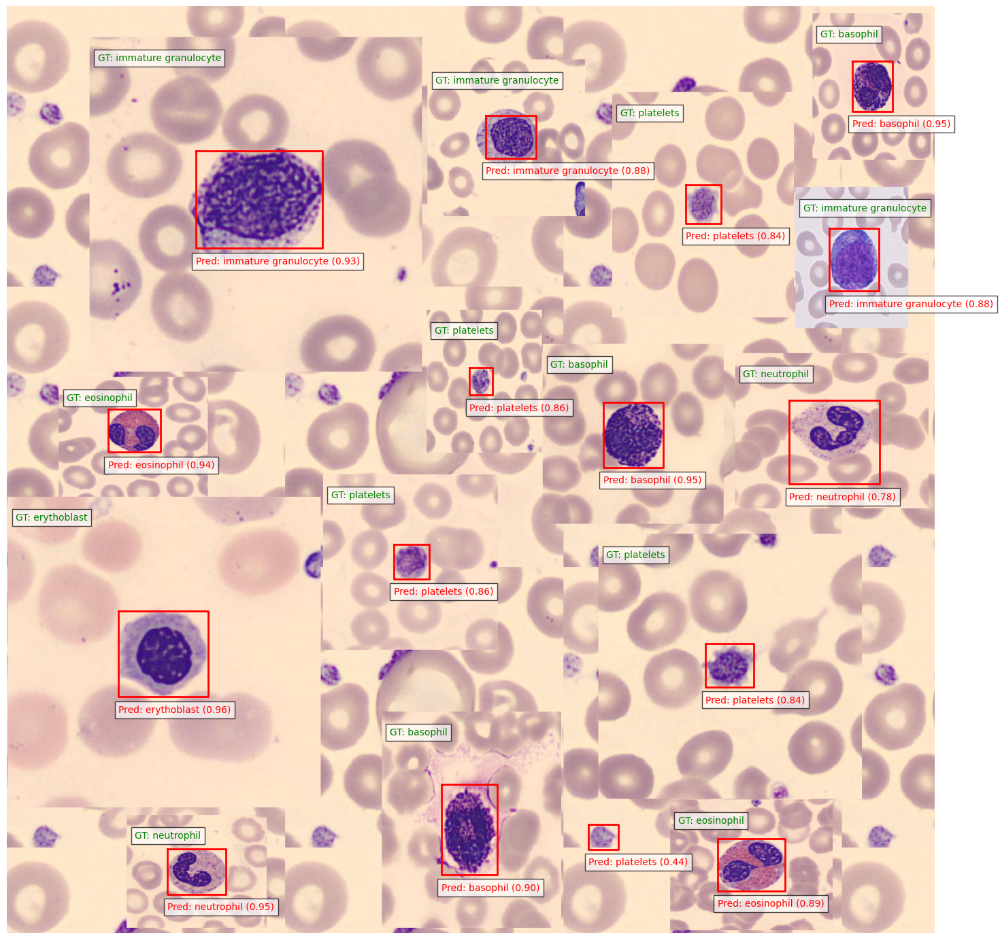

In [7]:
def visualize_predictions_and_truth(combined_img, all_labels, results, image_positions):
    """
    Visualize both predictions and ground truth labels.
    Args:
        combined_img: Combined image array
        all_labels: List of ground truth labels for each image
        results: YOLO prediction results
        image_positions: List of image placement information
    """
    plt.figure(figsize=(15, 15))
    plt.imshow(cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB))
    
    # Add ground truth labels for each image
    for idx, (labels, (x, y, width, height)) in enumerate(zip(all_labels, image_positions)):
        # Create ground truth label text
        gt_text = "GT: " + ', '.join(set(labels))  # Remove duplicates
        
        # Add white background behind text for better visibility
        plt.text(x + 10, y + 30, gt_text,
                bbox=dict(facecolor='white', alpha=0.7),
                fontsize=10,
                color='green')
    
    # Add predictions and boxes
    for result in results:
        boxes = result.boxes
        for box in boxes:
            # Get box coordinates and details
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf.cpu().numpy()[0]
            cls = box.cls.cpu().numpy()[0]
            
            # Draw box
            plt.plot([x1, x2, x2, x1, x1], [y1, y1, y2, y2, y1], 'r-', linewidth=2)
            
            # Add prediction label
            pred_text = f'Pred: {model.names[int(cls)]} ({conf:.2f})'
            plt.text(x1, y2 + 20, pred_text,
                    bbox=dict(facecolor='white', alpha=0.7),
                    fontsize=10,
                    color='red')
    
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def create_random_combined_image(img_dir, label_dir, class_names, bg_image_path, canvas_size=(1200, 1200), max_attempts=200):
    """
    Create a densely packed combined image with random rotations/scaling, 
    using the provided image as the background instead of a white canvas.
    """
    test_images = list(Path(img_dir).glob("*.*"))
    random.shuffle(test_images)
    
    # Load the provided background image
    bg_image = cv2.imread(bg_image_path)
    if bg_image is None:
        raise ValueError("Background image could not be loaded!")
    
    # Create a 4x4 tiled background
    tile_size = (bg_image.shape[1], bg_image.shape[0])  # (width, height)
    rows, cols = (canvas_size[1] // tile_size[1] + 1, canvas_size[0] // tile_size[0] + 1)
    combined_img = np.tile(bg_image, (rows, cols, 1))[:canvas_size[1], :canvas_size[0]]

    image_positions = []
    all_labels = []

    for img_path in test_images:
        label_path = Path(label_dir) / (img_path.stem + '.txt')
        class_indices = read_label_file(label_path)
        
        img = cv2.imread(str(img_path))
        if img is None:
            continue

        # Dynamic scaling with wider range
        min_scale, max_scale = 0.15, 0.4
        for _ in range(3):  # Try 3 different sizes
            scale = random.uniform(min_scale, max_scale)
            aspect = random.choice([0.8, 1.0, 1.2])  
            new_width = int(canvas_size[0] * scale)
            new_height = int(new_width * aspect * (img.shape[0] / img.shape[1]))

            # Ensure minimum dimensions
            new_width = max(new_width, 50)
            new_height = max(new_height, 50)
            if new_width > canvas_size[0] or new_height > canvas_size[1]:
                continue
                
            resized_img = cv2.resize(img, (new_width, new_height))

            # Random rotation
            rot = random.choice([0, 1, 2, 3])
            if rot == 1 or rot == 3:
                resized_img = cv2.rotate(resized_img, cv2.ROTATE_90_CLOCKWISE if rot == 1 else cv2.ROTATE_90_COUNTERCLOCKWISE)
                new_width, new_height = new_height, new_width

            # Try placing
            placed = False
            for _ in range(max_attempts):
                x = random.randint(0, canvas_size[0] - new_width)
                y = random.randint(0, canvas_size[1] - new_height)
                
                # Check collisions
                collision = False
                for (px, py, pw, ph) in image_positions:
                    if (x < px + pw and x + new_width > px and 
                        y < py + ph and y + new_height > py):
                        collision = True
                        break
                
                if not collision:
                    combined_img[y:y+new_height, x:x+new_width] = resized_img
                    labels = [class_names[idx] for idx in class_indices]
                    all_labels.append(labels)
                    image_positions.append((x, y, new_width, new_height))
                    placed = True
                    break
                    
            if placed:
                break
            else:  
                max_scale *= 0.8  

    return combined_img, all_labels, image_positions


# Usage example:
bg_image_path = "background.png"  # Your background image

combined_img, all_labels, image_positions = create_random_combined_image(
    test_img_dir, 
    label_dir,
    model.names,  
    bg_image_path,  
    canvas_size=(1200, 1200)  
)



combined_img, all_labels, image_positions = create_random_combined_image(
    test_img_dir, 
    label_dir,
    model.names,  
    bg_image_path,  
    canvas_size=(1200, 1200)  
)

# Run prediction on the combined image
results = model(combined_img)

# Visualize both predictions and ground truth
visualize_predictions_and_truth(combined_img, all_labels, results, image_positions)